# Sitios turisticos


In [2]:
import numpy as np
import json
import pandas as pd
import arcgis
import folium

In [27]:
import pandas as pd

# Leer archivo CSV con la codificación adecuada
df = pd.read_csv('atractivos_turisticos.csv', encoding='latin1')
df


,OBJECTID,Shape,imperdible,cod_comuna,cod,nombre_sitio,tipo_atractivo,orden_visualizacion,direccion,sitio_web,nombre_comuna,cod_barrio,barrio,x_origen_nacional,y_origen_nacional,latitud,longitud
0,1,"(4713317.744900001, 2246254.5177000016)",NO,15,AT001,Aeroparque Parque Juan Pablo II,Parque temático y recreativo,14,CR 70 No. 16 - 04,https://aeroparquejuanpablo.gov.co/,Guayabal,Inst_19,Parque Juan Pablo II,4.713318e+06,2.246255e+06,6.222290,-75.591675
1,2,"(4713559.109200001, 2245875.2638000026)",NO,15,AT002,Aeropuerto Enrique Olaya Herrera,Aeropuerto de pasajeros,37,CR 65 A No. 13 - 157,https://www.aeropuertomedellin.co/,Guayabal,Inst_19,Parque Juan Pablo II,4.713559e+06,2.245875e+06,6.218872,-75.589478
2,3,"(4716641.4362, 2250356.483500004)",NO,10,AT003,Barrio Prado,Sector urbano o rural de interés,0,CR 50 No. 62-99,,La Candelaria,1001,Prado,4.716641e+06,2.250356e+06,6.259521,-75.561829
3,4,"(4716008.103700001, 2249319.9003000017)",NO,10,AT004,Basílica Menor Nuestra Señora de la Candelaria,Basílica,35,CR 49 a No. 50 - 85,https://arqmedellin.co/parroquias/nuestra-seno...,La Candelaria,1019,La Candelaria,4.716008e+06,2.249320e+06,6.250122,-75.567505
4,5,"(4713705.0748000005, 2249459.4629000034)",NO,11,AT005,Bulevar Libertadores de América,Sector urbano o rural de interés,2,CR 70 entre la CL 47D y circular 1A,,Laureles Estadio,1117,Florida Nueva,4.713705e+06,2.249459e+06,6.251282,-75.588318
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
87,88,"(4716925.4429, 2249025.1318999995)",NO,10,AT088,Teatro Pablo Tobón Uribe,Teatro,32,CR 40 No. 51 - 24,https://www.teatropablotobon.com/,La Candelaria,1016,Boston,4.716925e+06,2.249025e+06,6.247498,-75.559204
88,89,"(4716773.944600001, 2249822.4996000007)",NO,10,AT089,Teatro Prado el Águila Descalza,Teatro,12,CR 45d No. 59 - 01,https://www.aguiladescalza.com.co/,La Candelaria,1017,Los Ángeles,4.716774e+06,2.249822e+06,6.254700,-75.560608
89,90,"(4713518.877700002, 2250061.242299998)",NO,11,AT090,Unidad Deportiva Atanasio Girardot,Otro,54,Entre CRs 70 y 74 y CLs 48 y 50,https://www.medellin.travel/unidad-deportiva-a...,Laureles Estadio,Inst_14,U.D. Atanasio Girardot,4.713519e+06,2.250061e+06,6.256714,-75.590027
90,91,"(4713784.636000001, 2247778.010300001)",NO,16,AT091,Unidad Deportiva de Belén Andrés Escobar Salda...,Estadio,20,CR 66 B No. 31 A - 15,https://filmedellin.com/locaciones/unidad-depo...,Belén,1602,Rosales,4.713785e+06,2.247778e+06,6.236084,-75.587524


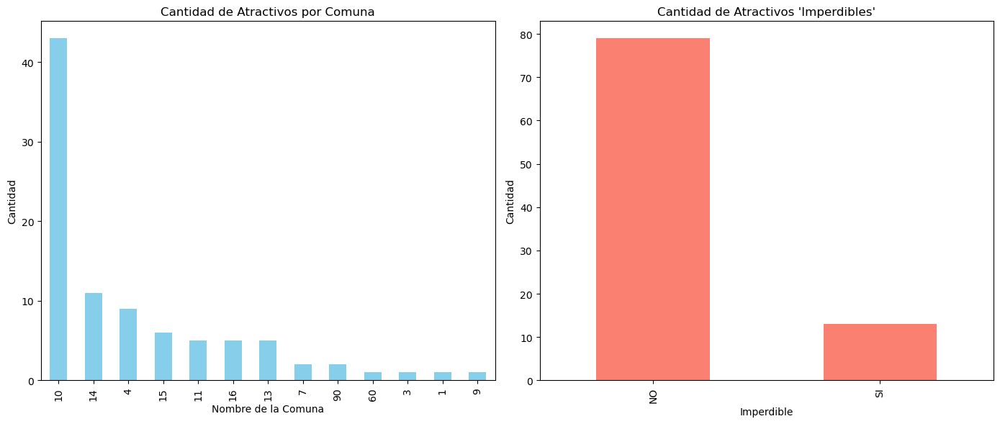

In [29]:
import matplotlib.pyplot as plt

# Crear la figura y los dos subplots
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(14, 6))

# Histograma de la cantidad de atractivos turísticos por nombre_comuna
df['cod_comuna'].value_counts().plot(kind='bar', color='skyblue', ax=axes[0])
axes[0].set_title("Cantidad de Atractivos por Comuna")
axes[0].set_xlabel("Nombre de la Comuna")
axes[0].set_ylabel("Cantidad")

# Histograma de la cantidad de atractivos turísticos por "imperdible"
df['imperdible'].value_counts().plot(kind='bar', color='salmon', ax=axes[1])
axes[1].set_title("Cantidad de Atractivos 'Imperdibles'")
axes[1].set_xlabel("Imperdible")
axes[1].set_ylabel("Cantidad")

# Ajustar el layout para mejor presentación
plt.tight_layout()
plt.show()


In [31]:
# Informacion de numero de atracciones turisticas por comuna
atracciones = df['cod_comuna'].value_counts()

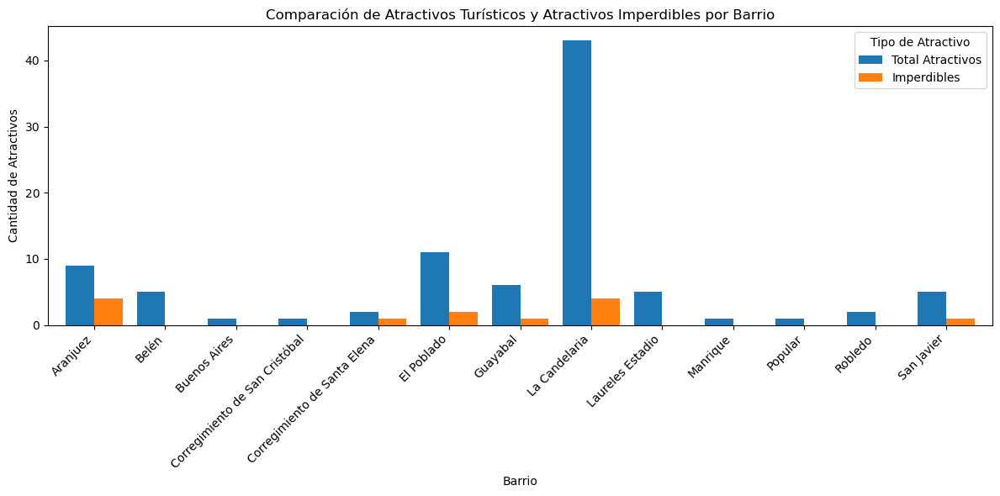

In [33]:
import matplotlib.pyplot as plt

# Contar la cantidad total de atractivos turísticos por barrio
total_por_barrio = df['nombre_comuna'].value_counts()

# Contar la cantidad de 'imperdibles' por barrio
imperdibles_por_barrio = df[df['imperdible'] == 'SI'].groupby('nombre_comuna').size()

# Unir ambos conteos en un solo DataFrame
comparacion = pd.DataFrame({
    'Total Atractivos': total_por_barrio,
    'Imperdibles': imperdibles_por_barrio
}).fillna(0)  # Reemplazar los NaN con 0 en caso de que no haya imperdibles en algunos barrios

# Crear gráfico de barras doble
ax = comparacion.plot(kind='bar', figsize=(12, 6), width=0.8)

# Personalizar el gráfico
plt.title("Comparación de Atractivos Turísticos y Atractivos Imperdibles por Barrio")
plt.xlabel("Barrio")
plt.ylabel("Cantidad de Atractivos")
plt.xticks(rotation=45, ha='right')  # Rotar las etiquetas del eje X para mejor visualización
plt.legend(title="Tipo de Atractivo")

# Mostrar el gráfico
plt.tight_layout()
plt.savefig('plots/comparacion_atractivos.png')


In [21]:
import folium

# Crear un mapa centrado en Medellín
mapa_medellin = folium.Map(location=[6.2535, -75.5636], zoom_start=13)

# Coordenadas aproximadas de la Universidad de Antioquia (UdeA)
coordenadas_udea = [6.3000, -75.5667]

# Añadir marcador para la UdeA
folium.Marker(
    location=coordenadas_udea,
    popup="Universidad de Antioquia (UdeA)",
    icon=folium.Icon(color="blue", icon="info-sign")
).add_to(mapa_medellin)

# Mostrar el mapa
mapa_medellin


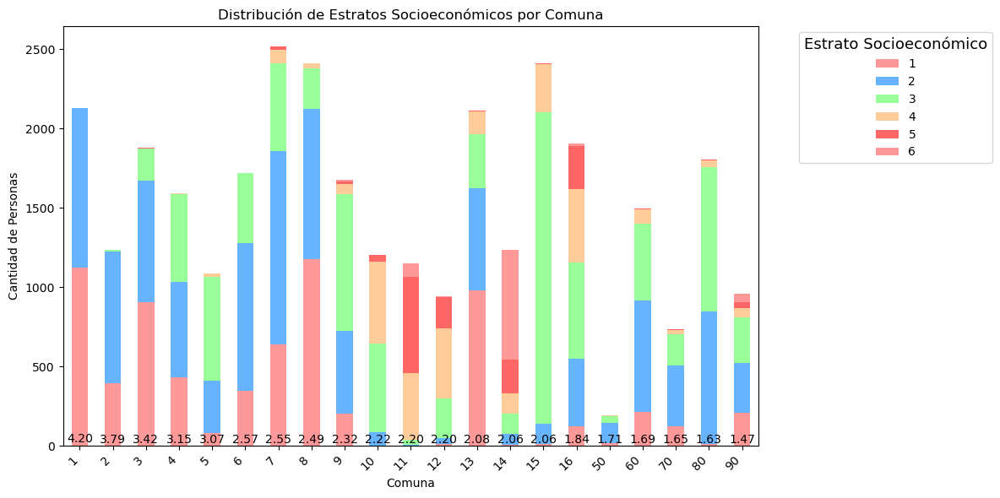

In [20]:
import matplotlib.pyplot as plt

# Contar la cantidad de ocurrencias de cada estrato por comuna
estratos_por_comuna = df_estrato.groupby(['comuna', 'estrato']).size().unstack(fill_value=0)

# Promedio de estrato por comuna
estratos_por_comuna['total'] = estratos_por_comuna.sum(axis=1)

# Colores personalizados para los estratos
colores_estratos = ['#FF9999', '#66B3FF', '#99FF99', '#FFCC99', '#FF6666']

# Graficar los estratos por comuna con colores personalizados
ax = estratos_por_comuna.drop('total', axis=1).plot(kind='bar', stacked=True, figsize=(12, 6), color=colores_estratos)


estratos_por_comuna['promedio'] = (estratos_por_comuna[1] + 2*estratos_por_comuna[2] + 3*estratos_por_comuna[3] + 4*estratos_por_comuna[4] + 5*estratos_por_comuna[5]) / estratos_por_comuna['total']
estratos_por_comuna = estratos_por_comuna.sort_values('promedio', ascending=False)

# Agregar los valores de promedio encima de cada barra
for idx, comuna in enumerate(estratos_por_comuna.index):
    ax.text(idx, estratos_por_comuna['promedio'].iloc[idx] + 0.1, f"{estratos_por_comuna['promedio'].iloc[idx]:.2f}",
            ha='center', va='bottom', fontsize=10, color='black')

# Personalizar el gráfico
plt.title("Distribución de Estratos Socioeconómicos por Comuna")
plt.xlabel("Comuna")
plt.ylabel("Cantidad de Personas")
plt.xticks(rotation=45, ha='right')  # Rotar las etiquetas del eje X para mejor visualización
plt.legend(title="Estrato Socioeconómico", title_fontsize='13', bbox_to_anchor=(1.05, 1), loc='upper left')

# Mostrar el gráfico
plt.tight_layout()
plt.savefig('plots/estratos_por_comuna.png')

In [37]:
atracciones

cod_comuna
10                                                       43
14                                                       11
4                                                         9
15                                                        6
11                                                        5
16                                                        5
13                                                        5
7                                                         2
90                                                        2
60                                                        1
3                                                         1
1                                                         1
9                                                         1
comuna    Index([10, 14, 4, 15, 11, 16, 13, 7, 90, 60, 3...
Name: count, dtype: object

In [74]:
df_comercios

,lat,lon,type
0,6.211987,-75.556782,Content
1,6.230117,-75.563327,eCommerce
2,6.230117,-75.563327,Business
3,6.211987,-75.556782,Business
4,6.301797,-75.553299,Business
...,...,...,...
360,6.218750,-75.586967,Business
361,6.251004,-75.563789,Business
362,6.239856,-75.573903,Business
363,6.239856,-75.573903,Business


In [92]:
df

,OBJECTID,Shape,imperdible,cod_comuna,cod,nombre_sitio,tipo_atractivo,orden_visualizacion,direccion,sitio_web,nombre_comuna,cod_barrio,barrio,x_origen_nacional,y_origen_nacional,latitud,longitud
0,1,"(4713317.744900001, 2246254.5177000016)",NO,15,AT001,Aeroparque Parque Juan Pablo II,Parque temático y recreativo,14,CR 70 No. 16 - 04,https://aeroparquejuanpablo.gov.co/,Guayabal,Inst_19,Parque Juan Pablo II,4.713318e+06,2.246255e+06,6.222290,-75.591675
1,2,"(4713559.109200001, 2245875.2638000026)",NO,15,AT002,Aeropuerto Enrique Olaya Herrera,Aeropuerto de pasajeros,37,CR 65 A No. 13 - 157,https://www.aeropuertomedellin.co/,Guayabal,Inst_19,Parque Juan Pablo II,4.713559e+06,2.245875e+06,6.218872,-75.589478
2,3,"(4716641.4362, 2250356.483500004)",NO,10,AT003,Barrio Prado,Sector urbano o rural de interés,0,CR 50 No. 62-99,,La Candelaria,1001,Prado,4.716641e+06,2.250356e+06,6.259521,-75.561829
3,4,"(4716008.103700001, 2249319.9003000017)",NO,10,AT004,Basílica Menor Nuestra Señora de la Candelaria,Basílica,35,CR 49 a No. 50 - 85,https://arqmedellin.co/parroquias/nuestra-seno...,La Candelaria,1019,La Candelaria,4.716008e+06,2.249320e+06,6.250122,-75.567505
4,5,"(4713705.0748000005, 2249459.4629000034)",NO,11,AT005,Bulevar Libertadores de América,Sector urbano o rural de interés,2,CR 70 entre la CL 47D y circular 1A,,Laureles Estadio,1117,Florida Nueva,4.713705e+06,2.249459e+06,6.251282,-75.588318
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
87,88,"(4716925.4429, 2249025.1318999995)",NO,10,AT088,Teatro Pablo Tobón Uribe,Teatro,32,CR 40 No. 51 - 24,https://www.teatropablotobon.com/,La Candelaria,1016,Boston,4.716925e+06,2.249025e+06,6.247498,-75.559204
88,89,"(4716773.944600001, 2249822.4996000007)",NO,10,AT089,Teatro Prado el Águila Descalza,Teatro,12,CR 45d No. 59 - 01,https://www.aguiladescalza.com.co/,La Candelaria,1017,Los Ángeles,4.716774e+06,2.249822e+06,6.254700,-75.560608
89,90,"(4713518.877700002, 2250061.242299998)",NO,11,AT090,Unidad Deportiva Atanasio Girardot,Otro,54,Entre CRs 70 y 74 y CLs 48 y 50,https://www.medellin.travel/unidad-deportiva-a...,Laureles Estadio,Inst_14,U.D. Atanasio Girardot,4.713519e+06,2.250061e+06,6.256714,-75.590027
90,91,"(4713784.636000001, 2247778.010300001)",NO,16,AT091,Unidad Deportiva de Belén Andrés Escobar Salda...,Estadio,20,CR 66 B No. 31 A - 15,https://filmedellin.com/locaciones/unidad-depo...,Belén,1602,Rosales,4.713785e+06,2.247778e+06,6.236084,-75.587524


In [94]:
df_lugares1=pd.DataFrame()
df_lugares1["lat"]= df[df["imperdible"]=="SI"]["latitud"]
df_lugares1["lon"]= df[df["imperdible"]=="SI"]["longitud"]
df_lugares1["imperdible"]= df[df["imperdible"]=="SI"]["nombre_sitio"]
df_lugares1

,lat,lon,imperdible
9,6.254089,-75.563782,Catedral Basílica Metropolitana de la Inmacula...
24,6.247925,-75.621887,Escaleras Eléctricas Comuna 13
33,6.270691,-75.563721,Jardín Botánico Joaquín Antonio Uribe
44,6.245911,-75.556580,Museo Casa de la Memoria
46,6.265686,-75.561401,Museo Cementerio San Pedro
47,6.252319,-75.568909,Museo de Antioquia
48,6.223511,-75.574097,Museo de Arte Moderno de Medellín
50,6.190125,-75.569397,Museo El Castillo
61,6.270081,-75.565613,Parque Explora
67,6.289490,-75.510803,Parque Regional Ecoturístico Arví


In [98]:
df_lugares2 = pd.DataFrame()
df_lugares2["lat"]= df[df["imperdible"]=="NO"]["latitud"]
df_lugares2["lon"]= df[df["imperdible"]=="NO"]["longitud"]
df_lugares2["imperdible"]= df[df["imperdible"]=="NO"]["nombre_sitio"]
df_lugares2

,lat,lon,imperdible
0,6.222290,-75.591675,Aeroparque Parque Juan Pablo II
1,6.218872,-75.589478,Aeropuerto Enrique Olaya Herrera
2,6.259521,-75.561829,Barrio Prado
3,6.250122,-75.567505,Basílica Menor Nuestra Señora de la Candelaria
4,6.251282,-75.588318,Bulevar Libertadores de América
...,...,...,...
87,6.247498,-75.559204,Teatro Pablo Tobón Uribe
88,6.254700,-75.560608,Teatro Prado el Águila Descalza
89,6.256714,-75.590027,Unidad Deportiva Atanasio Girardot
90,6.236084,-75.587524,Unidad Deportiva de Belén Andrés Escobar Salda...


In [99]:

# Cargar el archivo GeoJSON o shapefile de las comunas de Medellín
comunas = gpd.read_file('comunas_y_corregimientos.geojson')  # o .shp

# Crear un mapa centrado en Medellín
mapa_medellin = folium.Map(location=[6.25184, -75.56359], zoom_start=12)

# Agregar las comunas al mapa como una capa
folium.GeoJson(comunas).add_to(mapa_medellin)

#leer txt con pandas
df_comercios = pd.read_csv('coordenadas_comercios.txt', encoding='latin1')
for i in range(len(df_comercios)):
    longitud = df_comercios['lon'][i]
    latitud = df_comercios['lat'][i]
    if df_comercios['type'][i] == 'Content':
        folium.Marker([latitud, longitud], popup=df_comercios['type'][i], icon=folium.Icon(color='blue')).add_to(mapa_medellin)
    if df_comercios['type'][i] == 'Business':
        folium.Marker([latitud, longitud], popup=df_comercios['type'][i], icon=folium.Icon(color='blue')).add_to(mapa_medellin)
    if df_comercios['type'][i] == 'eCommerce':
        folium.Marker([latitud, longitud], popup=df_comercios['type'][i], icon=folium.Icon(color='blue')).add_to(mapa_medellin)
    if df_comercios['type'][i] == 'Framed':
        folium.Marker([latitud, longitud], popup=df_comercios['type'][i], icon=folium.Icon(color='blue')).add_to(mapa_medellin)
    if df_comercios['type'][i] == 'Placeholder':
        folium.Marker([latitud, longitud], popup=df_comercios['type'][i], icon=folium.Icon(color='blue')).add_to(mapa_medellin)

for j in range(len(df_lugares1)):
    longitud = df_lugares1['lon'].iloc[j]
    latitud = df_lugares1['lat'].iloc[j]
    folium.Marker([latitud, longitud], popup=df_lugares1['imperdible'].iloc[j], icon=folium.Icon(color='purple')).add_to(mapa_medellin)

for k in range(len(df_lugares2)):
    longitud = df_lugares2['lon'].iloc[k]
    latitud = df_lugares2['lat'].iloc[k]
    folium.Marker([latitud, longitud], popup=df_lugares2['imperdible'].iloc[k], icon=folium.Icon(color='green')).add_to(mapa_medellin)

#leyenda
from folium.plugins import FloatImage
url = 'https://raw.githubusercontent.com/ivanhercaz/visualizacion/master/leyenda.png'
FloatImage(url, bottom=5, left=5).add_to(mapa_medellin)



# Mostrar el mapa
mapa_medellin.save('mapa_comercios.html')
mapa_medellin
    

In [67]:
import folium
import geopandas as gpd
import pandas as pd
from folium import Icon

# Cargar el archivo GeoJSON o shapefile de las comunas de Medellín
comunas = gpd.read_file('comunas_y_corregimientos.geojson')  # o .shp

# Crear un mapa centrado en Medellín
mapa = folium.Map(location=[6.25184, -75.56359], zoom_start=12)

# Agregar las comunas al mapa como una capa
folium.GeoJson(comunas).add_to(mapa)

# Leer el archivo de coordenadas de los comercios
df_comercios = pd.read_csv('coordenadas_comercios.txt', encoding='latin1')
df_comercios.columns = ['cor']

# Iterar sobre cada comercio para agregar un marcador personalizado
for i in range(len(df_comercios)):
    latitud = float(df_comercios['cor'][i].split(" ")[0])
    longitud = float(df_comercios['cor'][i].split(" ")[1])
    
    # Crear un marcador personalizado con icono de un color específico y tamaño ajustado
    folium.Marker(
        [latitud, longitud],
        popup="Comercio",
        icon=folium.Icon(
            color='green',  # Color del marcador (puedes usar 'red', 'green', 'blue', etc.)
            icon_color='white',  # Color del icono (puedes cambiarlo)
            icon='info-sign',  # Forma del icono (puedes cambiarlo por otros disponibles en folium)
            prefix='glyphicon',  # Usado para iconos predeterminados de Bootstrap, 'glyphicon' es uno de ellos
        )
    ).add_to(mapa)

# Guardar el mapa en un archivo HTML
mapa.save('mapa_comunas_medellin.html')

# Si estás trabajando en un Jupyter Notebook, puedes mostrar el mapa con:
mapa
